# Answer 1

## 1.1
Size 5.76 MB = 5760 kb = 5760000 bytes
Aspect ratio 4:3 <br>
height = 3x <br>
width = 4x <br>
assuming standard intensity range of 0 − 255 per pixel per channel <br>
bits per pixel per channel = 8 <br>
bytes per pixel per channel = 1 <br>
bytes per pixel = 3 <br>
Size = height * width * bpp <br>
=> 5760000 = 3x * 4x * 3 <br>
=> x = 400 <br>

Conclusion:<br>
Height = 1200 pixels, Width = 1600 pixels<br>

## 1.2
a)<br>
Size of one square black and white image with width 5200 pixels<br>
Size = 5200 * 5200 * 1 = 27040000 bytes = 27.04 MB<br>
Total space required = 2000 * 27.04 = 54080 MB = 54.08 GB<br>
b)<br>
Size of one square grayscale image with width 5200 pixels<br>
Size = 5200 * 5200 * 2 = 54080000 bytes = 54.08 MB<br>
Total space required = 2000 * 54.08 = 108160 MB = 108.16 GB<br>
c)<br>
Size of one square coloured image with width 5200 pixels<br>
Size = 5200 * 5200 * 3 = 81120000 bytes = 81.12 MB<br>
Total space required = 2000 * 81.12 = 162240 MB = 162.24 GB<br>

Conclusion:<br>
a) Minimum number of 64 GB cards required = 1 <br>
b) Minimum number of 64 GB cards required = 2 <br>
c) Minimum number of 64 GB cards required = 3 <br>

## 1.3
Resolution refers to the pixels displayed per inch of the image. However, on the bill board. When Andy and Dwight saw the poster on their desktop, since the size of individual pixels on a desktop screen is very small, they felt that the image was high resolution. However, the image is enlarged to fit the bill board and the size of each pixel is comparatively much bigger and it is easier to distinguish between them. This is the reason why they were able to see individual pixels when they printed the bill board.
  

# Answer 2

In [1]:
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
IMG_PATH = '../imgs/' 
background = cv2.imread(IMG_PATH+'background.png')
background = cv2.cvtColor(background,cv2.COLOR_BGR2RGB)
foreground = cv2.imread(IMG_PATH+'foreground.png')
foreground = cv2.cvtColor(foreground,cv2.COLOR_BGR2RGB)
# plt.imshow(foreground)

## 2.1

In [2]:
def most_freq_colour (nparray):
    h,w,l = nparray.shape
    r = 0
    g = 0
    b = 0
    for x in range(h):
        for y in range(w):
            r += nparray[x-1,y-1,0]
            g += nparray[x-1,y-1,1]
            b += nparray[x-1,y-1,2]
    # print(r,g,b)
    if (r > g) and (r > b):
        print('Most frequently occuring colour is Red')
    elif (g > r) and (g > b):
        print('Most frequently occuring colour is Green')
    else:
        print('Most frequently occuring colour is Blue')

In [3]:
most_freq_colour(foreground)

Most frequently occuring colour is Green


## 2.2

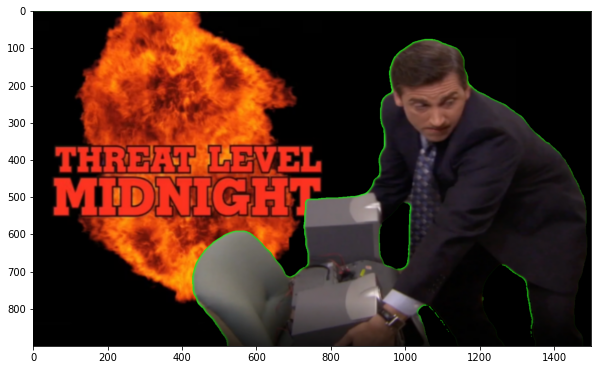

In [4]:
def mergeImage (foreground,background):
    lowThres = np.array([0,30,0])
    uppThres = np.array([20,255,20])
    mask = cv2.inRange(foreground, lowThres, uppThres)
    fig = plt.figure(figsize = (10,10))
    # plt.subplot(2,2,1)
    # plt.imshow(mask, cmap='gray')
    temp1 = foreground
    temp1[mask != 0] = [0,0,0]
    # plt.subplot(2,2,2)
    # plt.imshow(temp1)
    comb1 = background
    comb1[mask == 0] = [0,0,0]
    # plt.subplot(2,2,3)
    # plt.imshow(comb1)
    comb1 = comb1 + temp1
    # plt.subplot(2,2,4)
    plt.imshow(comb1)

foreground = cv2.resize(foreground, (1500,900))
mergeImage(foreground,background)


# Answer 3

In [5]:
# loading images

pam1 = cv2.imread(IMG_PATH+'pam1.png')
pam2 = cv2.imread(IMG_PATH+'pam2.png')
peace = cv2.imread(IMG_PATH+'peace.jpg')    # image of choice
# plt.imshow(pam1)

## 3.1

In [6]:
def piecewiseLinTransform(img,k1,k2,a,b):
    img = img.astype(float)/255
    temp = img
    dimensions = temp.shape
    height = dimensions[0]
    width = dimensions[1]
    for i in range(height):
        for j in range(width):
            for k in range(len(k1)):
                if(img[i,j,0]>=a[k] and img[i,j,0]<b[k]):
                    temp[i,j] = np.round((img[i,j,0]*k1[k]+k2[k])*255)
                    break
    img = img*255
    return temp.astype(np.uint8)
  

## 3.2

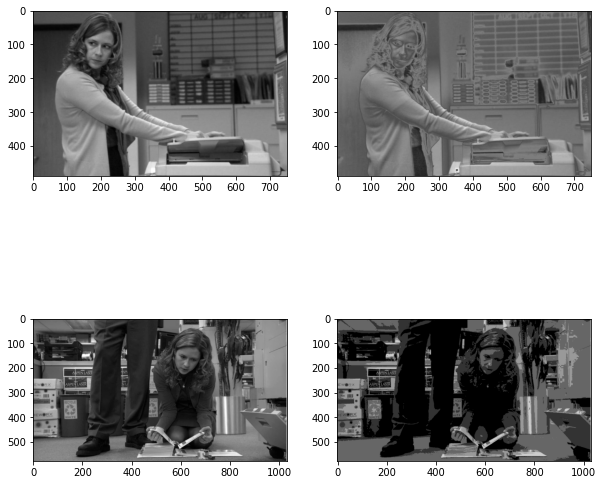

In [7]:
# plot1
K1 = [2, -1, 1]
K2 = [0.1, 0.7, -0.1]
A = [0, 0.2, 0.4]
B = [0.2, 0.4, 1]
pam1_new = piecewiseLinTransform(pam1,K1,K2,A,B)

# plot2
K1 = [0,0,0,0,0,0]
K2 = [0,0.2,0.4,0.6,0.8,1]
A = [0,0.2,0.4,0.6,0.8,0.999]
B = [0.2,0.4,0.6,0.8,0.999,1]
pam2_new = piecewiseLinTransform(pam2,K1,K2,A,B)

fig = plt.figure(figsize = (10,10))
plt.subplot(2,2,1)
plt.imshow(pam1,cmap='gray')
plt.subplot(2,2,2)
plt.imshow(pam1_new,cmap='gray')
plt.subplot(2,2,3)
plt.imshow(pam2,cmap='gray')
plt.subplot(2,2,4)
plt.imshow(pam2_new,cmap='gray')

## 3.3

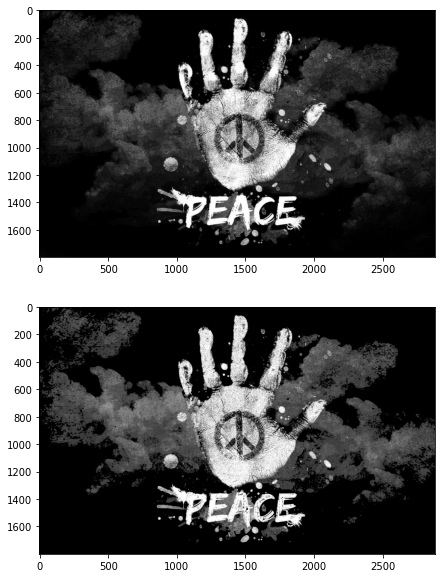

In [8]:
K1 = [0,1,0]
K2 = [0,0.1,1]
A = [0,0.1,0.9]
B = [0.1,0.9,1]
# values should improve strength at upper and lower values
peace_new = piecewiseLinTransform(peace,K1,K2,A,B)
fig = plt.figure(figsize = (10,10))
plt.subplot(2,1,1)
plt.imshow(peace,cmap='gray')
plt.subplot(2,1,2)
plt.imshow(peace_new,cmap='gray')

# Answer 4

## 4.1

In [9]:
rupee = cv2.imread(IMG_PATH+'rupee.jpg')
rupee = cv2.cvtColor(rupee,cv2.COLOR_BGR2RGB)
securityThreat = cv2.imread(IMG_PATH+'securityThreat.jpg')
securityThreat = cv2.cvtColor(securityThreat,cv2.COLOR_BGR2RGB)
pepper = cv2.imread(IMG_PATH+'pepper.jpg')
pepper = cv2.cvtColor(pepper,cv2.COLOR_BGR2RGB)

In [10]:
def bitSlice(img,k):
    plane = np.mod(np.floor(img/(2**(k-1))), 2)
    return plane

## 4.2

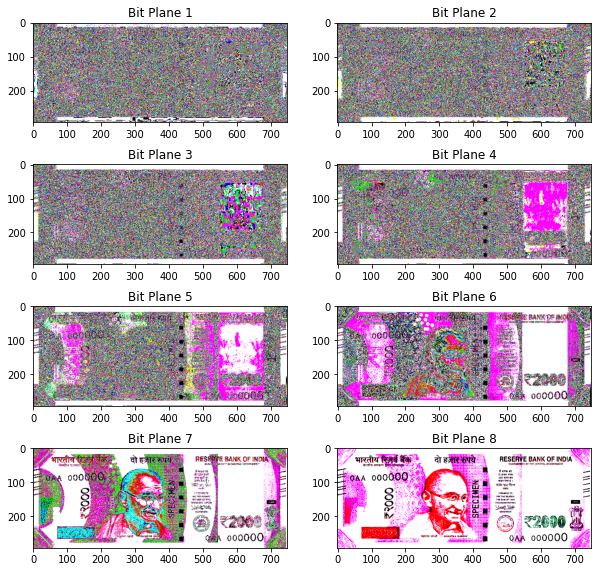

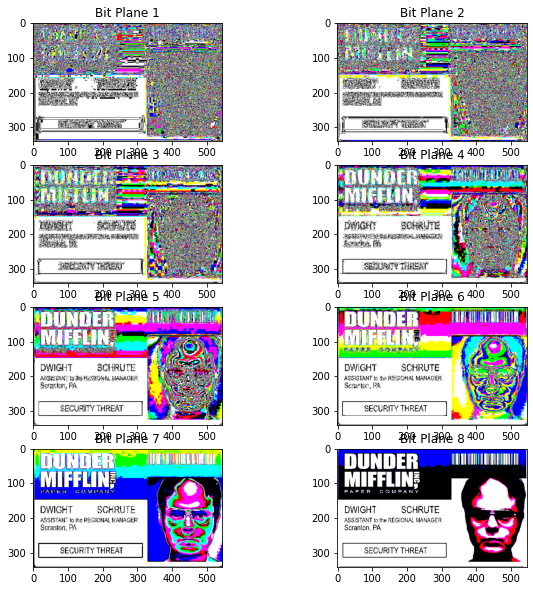

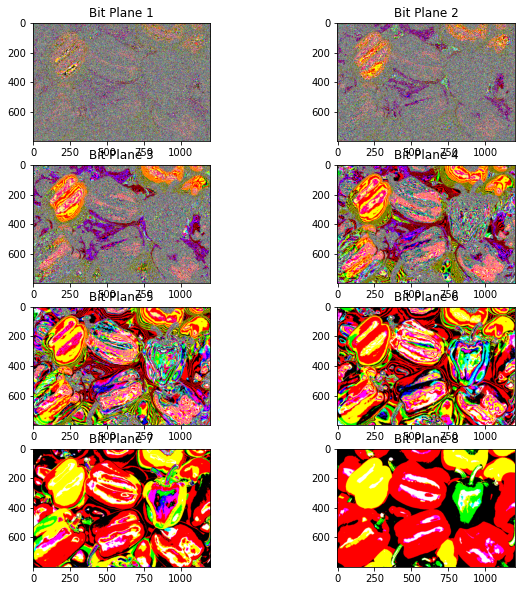

In [11]:
# rupee.jpg
fig = plt.figure(figsize = (10,10))
for x in range(4):
    for y in range(2):
        k = 2*x+y+1
        plane = bitSlice(rupee,k)
        plt.subplot(4,2,k)
        plt.imshow(plane)
        plt.title('Bit Plane ' +str(k))

# securityThreat.jpg
fig = plt.figure(figsize = (10,10))
for x in range(4):
    for y in range(2):
        k = 2*x+y+1
        plane = bitSlice(securityThreat,k)
        plt.subplot(4,2,k)
        plt.imshow(plane)
        plt.title('Bit Plane ' +str(k))

# pepper.jpg
fig = plt.figure(figsize = (10,10))
for x in range(4):
    for y in range(2):
        k = 2*x+y+1
        plane = bitSlice(pepper,k)
        plt.subplot(4,2,k)
        plt.imshow(plane)
        plt.title('Bit Plane ' +str(k))

## 4.3

In [12]:
def imgBitQuantizer(img,k):
    image = np.rint((img / 255) * (pow(2, k) - 1))
    return image.astype(int)

## 4.4

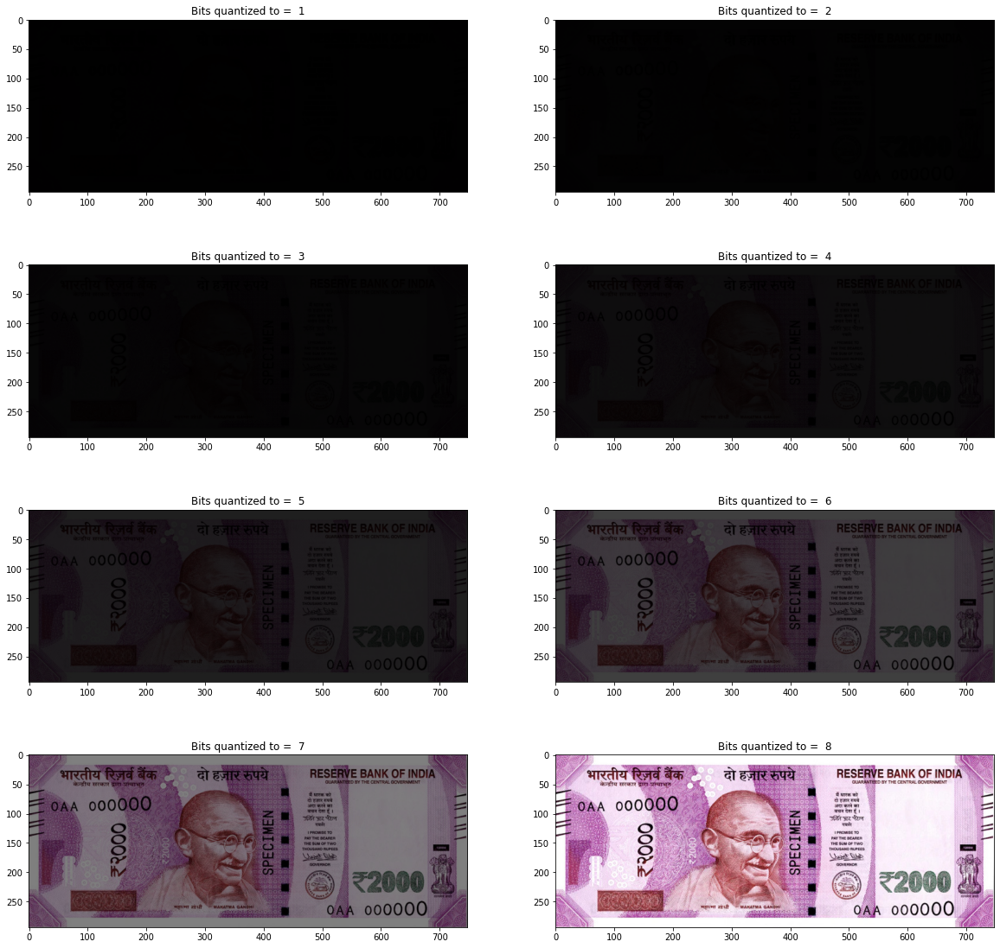

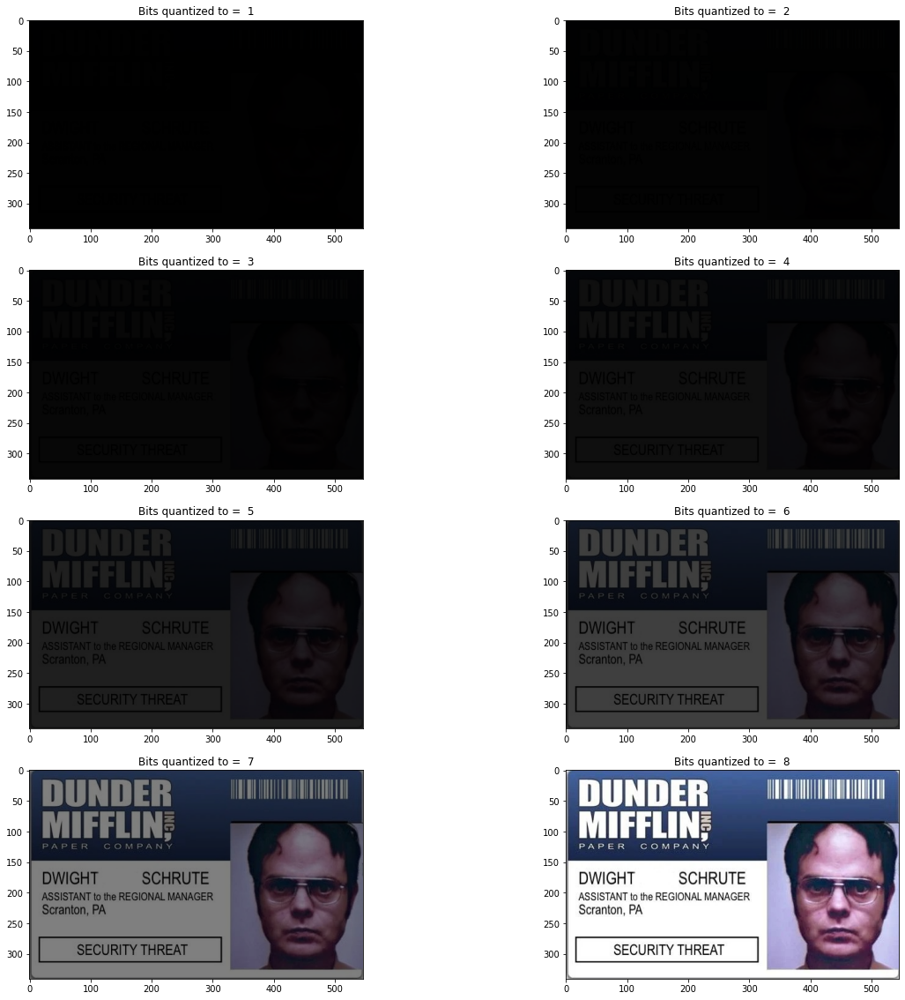

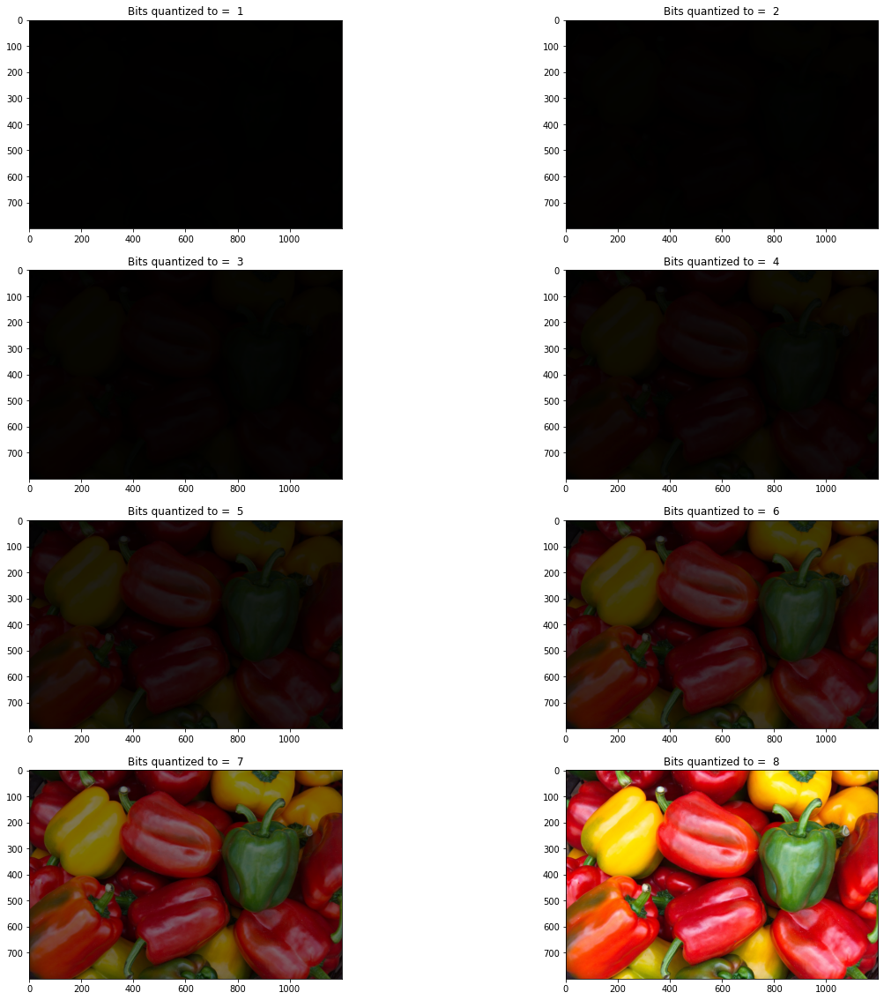

In [13]:
# rupee.jpg
fig = plt.figure(figsize = (20,20))
for x in range(4):
    for y in range(2):
        k = 2*x+y+1
        quant = imgBitQuantizer(rupee,k)
        plt.subplot(4,2,k)
        plt.imshow(quant)
        plt.title('Bits quantized to =  ' +str(k))

# securityThreat.jpg
fig = plt.figure(figsize = (20,20))
for x in range(4):
    for y in range(2):
        k = 2*x+y+1
        quant = imgBitQuantizer(securityThreat,k)
        plt.subplot(4,2,k)
        plt.imshow(quant)
        plt.title('Bits quantized to =  ' +str(k))

# pepper.jpg
fig = plt.figure(figsize = (20,20))
for x in range(4):
    for y in range(2):
        k = 2*x+y+1
        quant = imgBitQuantizer(pepper,k)
        plt.subplot(4,2,k)
        plt.imshow(quant)
        plt.title('Bits quantized to =  ' +str(k))

Explanation for Plots of 4.2 and 4.4:

A bit plane of an image is a collection of bits that correspond to a certain bit location in each of the binary values that constitute the picture.
As we can see from the plots, data stored in each bit plane decreases from the most significant bit to the least significant bit.

Quantization is used in image processing to reduce a wide range of values to a single quantum value.
As we can see from the plots, the quality of our image is highly dependent on the number of bits it is quantized to. Assuming each pixel has range of 0 to 255, the best image is observed for quantization level = 8, i.e. no quantization. As we quantize to lesser levels, there is a lot of data loss.


## 4.5
An apparent application of bit plane slicing is in data compression. The number of bits stored for an image can be reduced by a lot by removing the least significant bits.

# Answer 5

## 5.1
### Part A
The range of acceptable gamma values of is 0 to infinity
### Part B
Assuming c = 1, since the input intensity will lie between 0 and 1, the output intensity will also always lie between 0 and 1
### Part C
For gamma < 1, more of the input intensities will map to higher output intensities.
For gamma = 1, the input intensities will map to same output intensities.
For gamma > 1, more of the input intensities will map to lower output intensities.

A plot of the input vs output intensities for different gamma is shown below

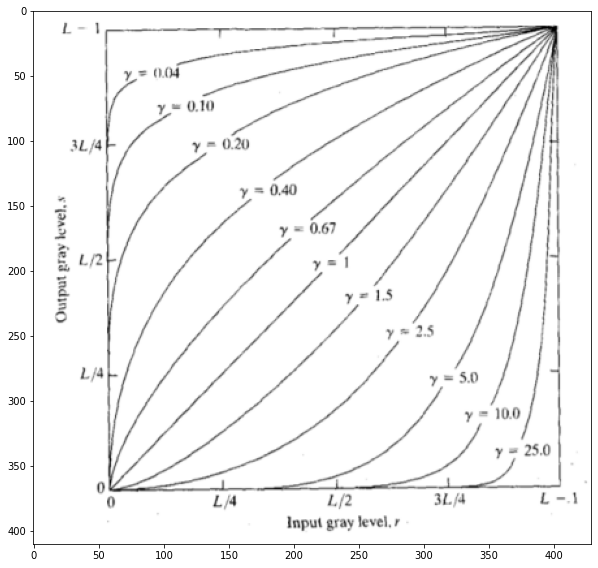

In [14]:
gamma = cv2.imread(IMG_PATH+'gamma.webp')
gamma = cv2.cvtColor(gamma,cv2.COLOR_BGR2RGB)
fig = plt.figure(figsize=[10,10])
plt.imshow(gamma)

## 5.2

In [15]:
def powerLawTransform(img,gamma):
    c = 1
    transform = img.astype(float)/255
    transform = c*pow(transform,gamma)
    transform = np.round(transform*255)
    return transform.astype(int)

## 5.3

In [16]:
# loading images
scrantonAreal = cv2.imread(IMG_PATH+'scrantonAreal.png')
scrantonAreal = cv2.cvtColor(scrantonAreal,cv2.COLOR_BGR2RGB)
tripGrpPhoto = cv2.imread(IMG_PATH+'tripGrpPhoto.png')
tripGrpPhoto = cv2.cvtColor(tripGrpPhoto,cv2.COLOR_BGR2RGB)

Text(0.5, 1.0, 'gamma = 9')

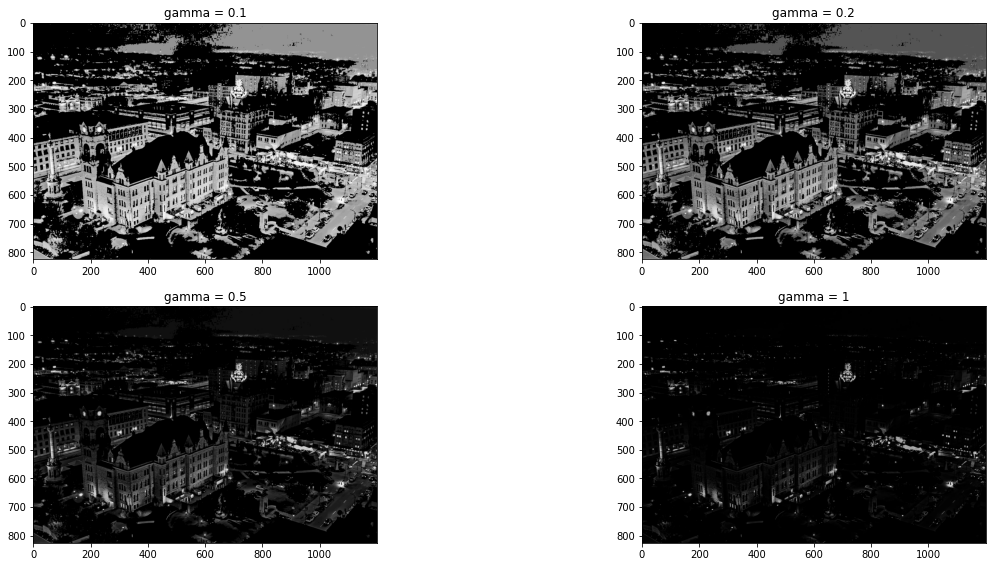

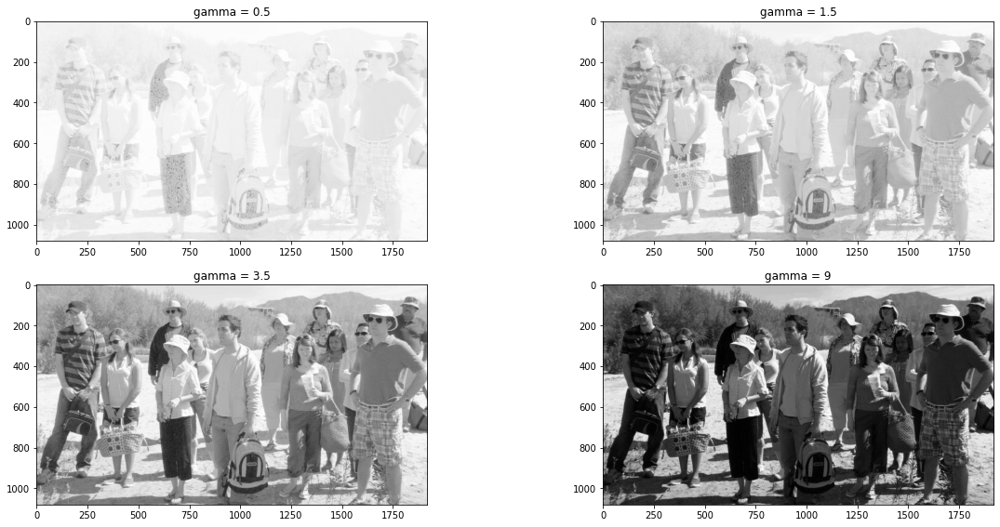

In [17]:
# scrantonAreal
gamma1 = powerLawTransform(scrantonAreal,0.1)
gamma2 = powerLawTransform(scrantonAreal,0.2)
gamma3 = powerLawTransform(scrantonAreal,0.5)
gamma4 = powerLawTransform(scrantonAreal,1)
fig = plt.figure(figsize = (20,20))
plt.subplot(4,2,1)
plt.imshow(gamma1)
plt.title('gamma = 0.1')
plt.subplot(4,2,2)
plt.imshow(gamma2)
plt.title('gamma = 0.2')
plt.subplot(4,2,3)
plt.imshow(gamma3)
plt.title('gamma = 0.5')
plt.subplot(4,2,4)
plt.imshow(gamma4)
plt.title('gamma = 1')

# tripGrpPhoto
gamma1 = powerLawTransform(tripGrpPhoto,0.5)
gamma2 = powerLawTransform(tripGrpPhoto,1.5)
gamma3 = powerLawTransform(tripGrpPhoto,3.5)
gamma4 = powerLawTransform(tripGrpPhoto,9)
fig = plt.figure(figsize = (20,20))
plt.subplot(4,2,1)
plt.imshow(gamma1)
plt.title('gamma = 0.5')
plt.subplot(4,2,2)
plt.imshow(gamma2)
plt.title('gamma = 1.5')
plt.subplot(4,2,3)
plt.imshow(gamma3)
plt.title('gamma = 3.5')
plt.subplot(4,2,4)
plt.imshow(gamma4)
plt.title('gamma = 9')

## 5.4
### Part A
One transform which can be used instead of gamma transform is log transform<br>
It is expressed by<br>
s = c*log(1+r)<br>
where s is output pixel value, r is input pixel value and c is the scaling factor. The value of ‘c’ is chosen such that we get the maximum output value corresponding to the bit size used.

### Part B

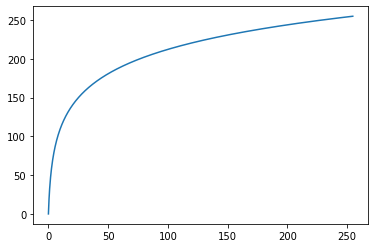

In [18]:
c = 255/np.log(1+255)
x = np.linspace(0,255,1000, endpoint=False)
y = c*np.log(1+x)
plt.plot(x,y)

### Part C

In [19]:
def logTransform(img):
    c = 1
    if np.log(np.amax(img)) != 0:
        c = 255/np.log(np.amax(img))
    transform = np.rint(c*np.log(1 + img))
    return transform.astype(int)

### Part D

C:\Users\gandh\AppData\Local\Temp\ipykernel_19904\1258107274.py:5: RuntimeWarning: divide by zero encountered in log
  transform = np.rint(c*np.log(1 + img))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


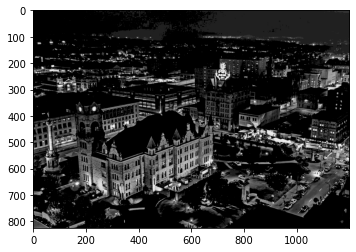

In [20]:
plt.imshow(logTransform(scrantonAreal))

Observations:
The image obtained by performing log transform is very similar to the one observed by performing gamma transform with gamme = 0.2.
These both images are closest to the original images.
The brightness of the images obtained increases on decreasing gamma and decreases on increasing it.

# Answer 6

In [21]:
Same_picture = cv2.imread(IMG_PATH+'Same_picture.png')
Same_picture = cv2.cvtColor(Same_picture,cv2.COLOR_BGR2RGB)
Creed = cv2.imread(IMG_PATH+'Creed.png')
Creed = cv2.cvtColor(Creed,cv2.COLOR_BGR2RGB)
Texture = cv2.imread(IMG_PATH+'Texture.jpg')
Texture = cv2.cvtColor(Texture,cv2.COLOR_BGR2RGB)
Match_in = cv2.imread(IMG_PATH+'6.2b_1.jpeg')
Match_in = cv2.cvtColor(Match_in,cv2.COLOR_BGR2RGB)
Match_ref = cv2.imread(IMG_PATH+'6.2b_2.jpeg')
Match_ref = cv2.cvtColor(Match_ref,cv2.COLOR_BGR2RGB)

## 6.1

In [22]:
def histogramEqualization(img):
    out = np.copy(img)
    # getting histogram
    count = np.zeros(256)
    for i in out.flatten():   # flatten converts ndarrray to 1 d array
        count[i] += 1
    # cumsum
    for i in range(255):
        count[i + 1] += count[i]
    # normalization
    arr = (count - count.min()) * 255
    scale = count.max() - count.min()
    count = arr/scale
    count = count.astype('uint8')
    for row in range(img.shape[0]):
        for col in range(img.shape[1]):
            out[row][col] = count[out[row][col]]
    return out

Text(0.5, 1.0, 'Histogram of equalized image')

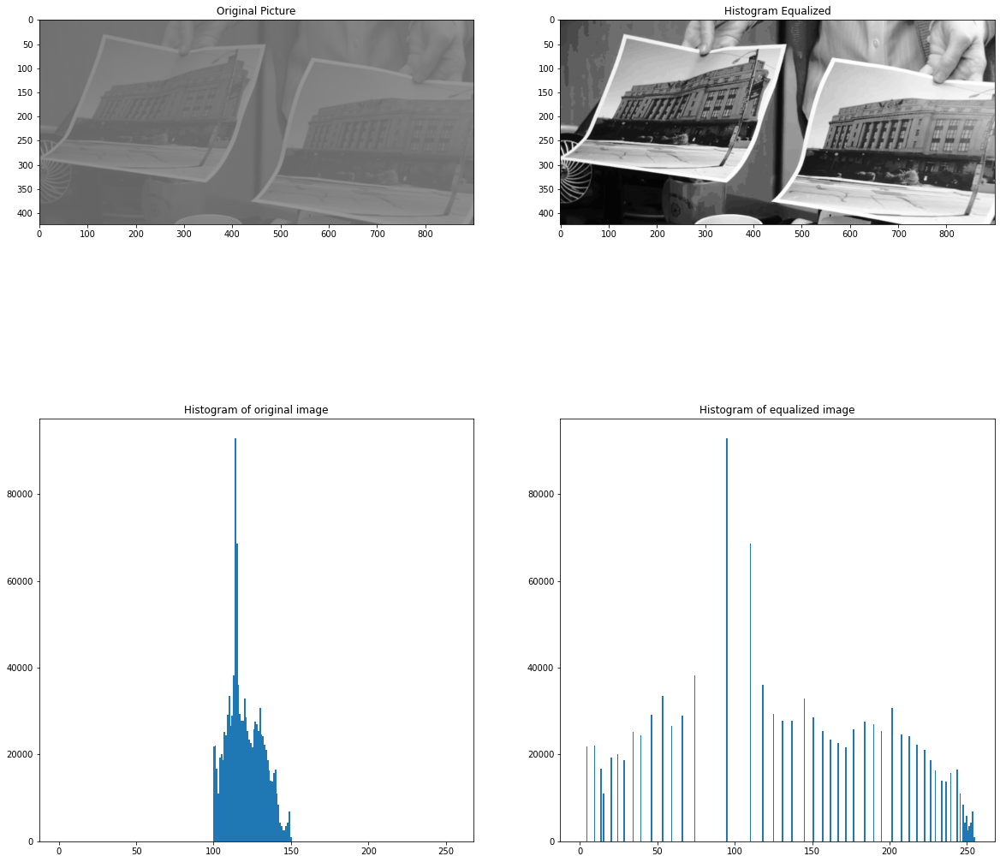

In [23]:
out = histogramEqualization(Same_picture)
fig = plt.figure(figsize = (20,20))
plt.subplot(2,2,1)
plt.imshow(Same_picture)
plt.title('Original Picture')
plt.subplot(2,2,2)
plt.imshow(out)
plt.title('Histogram Equalized')
plt.imshow(out)
plt.subplot(2,2,3)
plt.hist(Same_picture.ravel(),256,[0,255])
plt.show
plt.title('Histogram of original image')
plt.subplot(2,2,4)
plt.hist(out.ravel(),256,[0,255])
plt.show
plt.title('Histogram of equalized image')

Explanation:

As observed from the histogram of the input image, the pixel values all lie between 100 and 150. Due to this, there is very little contrast in the image and it is difficult to observe it.
After applying histogram equalization, we observe from the histogram of resultant image that the pixel values are much more spread out between 0 and 255. As a consequence, the resultant image is much more clearer and easy to observe.

## 6.2
### Part A

In [24]:
def histMatching(in_img,ref_img):
    # getting histogram
    out = np.copy(in_img)
    count_out = np.zeros(256)
    for i in out.flatten():
        count_out[i] += 1
    count_ref = np.zeros(256)
    for i in ref_img.flatten():
        count_ref[i] += 1
    # cumsum
    for i in range(255):
        count_out[i + 1] += count_out[i]
    for i in range(255):
        count_ref[i + 1] += count_ref[i]
    # Normalization
    arr_out = (count_out - count_out.min()) * 255
    arr_ref = (count_ref - count_ref.min()) * 255
    scale_out = count_out.max() - count_out.min()
    scale_ref = count_ref.max() - count_ref.min()
    count_out = arr_out/scale_out
    count_ref = arr_ref/scale_ref
    count_out = count_out.astype('uint8')
    count_ref = count_ref.astype('uint8')
    # We map each pixel x to the pixel value y so that the pixel x value in the input picture histogram is closest to the pixel y value in the reference image histogram.
    mapping = np.array([ np.abs(count_ref - count_out[i]).argmin() for i in range(256) ])
    for x in range(out.shape[0]):
        for y in range(out.shape[1]):
            out[x][y] = mapping[out[x][y]]
    return out
    

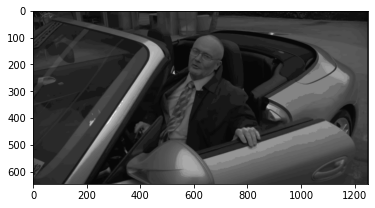

In [25]:
out = histMatching(Creed,Texture)
plt.imshow(out)

### Part B

Text(0.5, 1.0, 'Output image')

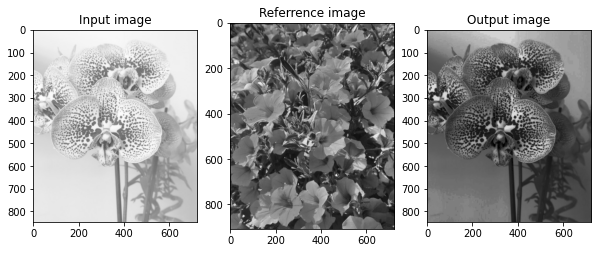

In [26]:
out = histMatching(Match_in,Match_ref)
fig =  plt.figure(figsize = (10,30))
plt.subplot(1,3,1)
plt.imshow(Match_in)
plt.title('Input image')
plt.subplot(1,3,2)
plt.imshow(Match_ref)
plt.title('Referrence image')
plt.subplot(1,3,3)
plt.imshow(out)
plt.title('Output image')

# Answer 7
## 7.1 Linear Spatial Filters
### 7.1.1 Mean Filter
#### 7.1.1.1

In [27]:
testPattern = cv2.imread(IMG_PATH+'testPattern.jpg')
testPattern = cv2.cvtColor(testPattern,cv2.COLOR_BGR2RGB)
# plt.imshow(testPattern)

In [28]:
def meanFilter(img, k):
  kSqr = k ** 2
  kby2 = int(k/2)
  # Padding image
  img3 = np.zeros((img.shape[0] + 2 * kby2, img.shape[1] + 2 * kby2))
  img3[kby2:img3.shape[0] - kby2, kby2:img3.shape[1] - kby2] = img
  result = img3.copy()
  img3 = img3.astype('float')
  result = result.astype('float')
  # Applying convolution
  for r in range(kby2, img3.shape[0] - kby2):
    for c in range(kby2, img3.shape[1] - kby2):
      # Finding sum of k x k block
      s = 0
      for i in range(r - kby2, r + kby2 + 1):
        for j in range(c - kby2, c + kby2 + 1):
          s += img3[i][j] / kSqr
      result[r][c] = s
  # Removing padded region and returning
  return np.rint(result[kby2:result.shape[0] - kby2, kby2:result.shape[1] - kby2]).astype('uint8')

#### 7.1.1.2

In [29]:
def effMeanFilter(img, k):
  kSqr = k ** 2
  kby2 = int(k / 2)
  # Padding image
  img3 = np.zeros((img.shape[0] + 2 * kby2, img.shape[1] + 2 * kby2))
  img3[kby2:img3.shape[0] - kby2, kby2:img3.shape[1] - kby2] = img

  # Finding prefix arrays
  prefixRows = []
  for r in range(len(img3)):
    prefixRows.append(img3[r].cumsum())

  prefixCols = []
  img3 = img3.T
  for r in range(len(img3)):
    prefixCols.append(img3[r].cumsum())

  img3 = img3.T.astype('float')
  # Filter value of first top leftmost block
  img3[kby2][kby2] = np.sum(img3[0:k,0:k]) / kSqr
  # Apllying average filter on other pixels
  for r in range(kby2, img3.shape[0] - kby2):
    for c in range(kby2, img3.shape[1] - kby2):
      if r == kby2 and c == kby2:
        continue
      if c == kby2:
        img3[r][c] = (img3[r - 1][c] * kSqr + prefixRows[r + kby2][k - 1] - prefixRows[r - kby2 - 1][k - 1]) / kSqr
        continue
      if r == kby2:
        img3[r][c] = (img3[r][c - 1] * kSqr + prefixCols[c + kby2][r + kby2] - prefixCols[c - kby2 - 1][r + kby2]) / kSqr
        continue
      img3[r][c] = (img3[r][c - 1] * kSqr + prefixCols[c + kby2][r + kby2] - prefixCols[c + kby2][r - kby2 - 1] - prefixCols[c - kby2 - 1][r + kby2] + prefixCols[c - kby2 - 1][r - kby2 - 1]) / kSqr
  # Removing padded region and returning
  return np.rint(img3[kby2:img3.shape[0] - kby2, kby2:img3.shape[1] - kby2]).astype('uint8')

#### 7.1.1.3

'Efficient Mean for img size = 512 and k = 11 done'

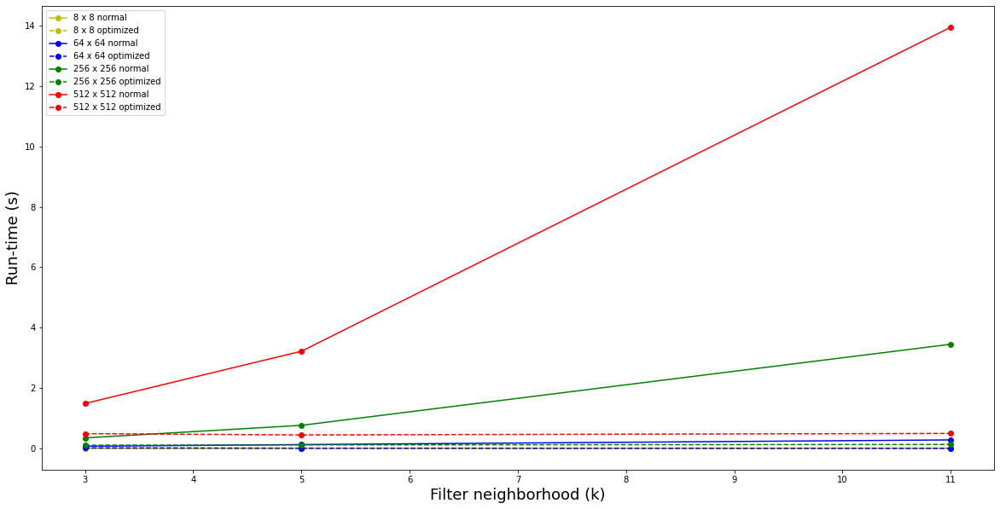

In [30]:
# For dynamic printing
from IPython.display import clear_output, display
from timeit import timeit
image_sizes = [8, 64, 256, 512]
k_values = [3, 5, 11]
colours = ['y', 'b', 'g', 'r']

plt.figure(figsize=(20, 10))
for cur_size in range(len(image_sizes)):
  # get random k x k image
  img = np.rint(np.random.uniform(low=0, high=255, size=(image_sizes[cur_size], image_sizes[cur_size]))).astype('uint8')
  yC = [[], []]
  for k in k_values:
    s = timeit('meanFilter(img, k)', setup='from __main__ import meanFilter, img, k', number=2)
    clear_output(wait=True)
    display("Normal Mean for img size = " + str(image_sizes[cur_size]) + " and k = " + str(k) + " done")
    yC[0].append(s / 2)
    s = timeit('effMeanFilter(img, k)', setup='from __main__ import effMeanFilter, img, k', number=2)
    clear_output(wait=True)
    display("Efficient Mean for img size = " + str(image_sizes[cur_size]) + " and k = " + str(k) + " done")
    yC[1].append(s / 2)
  plt.plot(k_values, yC[0], colours[cur_size], label=str(image_sizes[cur_size]) + " x " + str(image_sizes[cur_size]) + " normal", marker='o')
  plt.plot(k_values, yC[1], colours[cur_size] + '--', label=str(image_sizes[cur_size]) + " x " + str(image_sizes[cur_size]) + " optimized", marker='o')

print()
plt.xlabel('Filter neighborhood (k)', fontsize=18)
plt.ylabel('Run-time (s)', fontsize=18)
plt.legend()

#### 7.1.1.4

Text(0.5, 1.0, 'Histogram of k = 35 filtered')

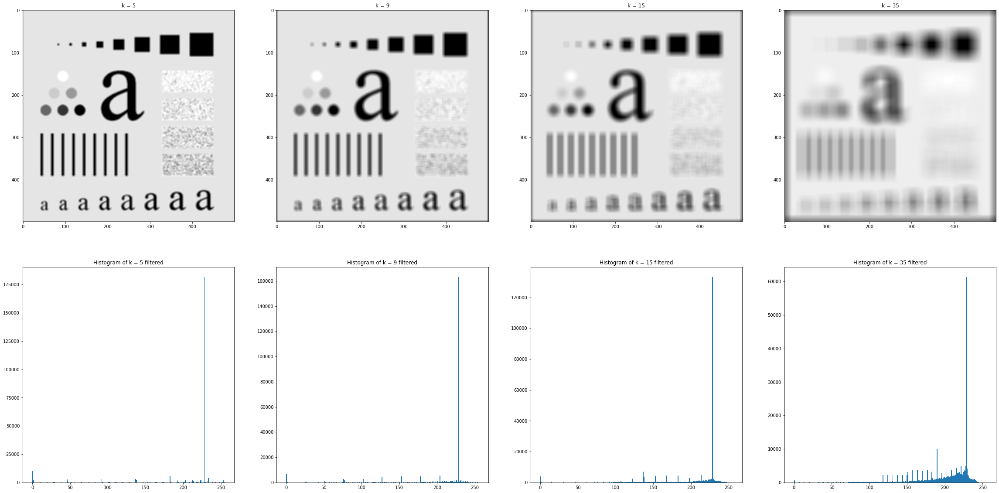

In [31]:
(one, two, three) = cv2.split(testPattern)
meanFiltered_5 = meanFilter(one,5)
meanFiltered_9 = meanFilter(one,9)
meanFiltered_15 = meanFilter(one,15)
meanFiltered_35 = meanFilter(one,35)
fig = plt.figure(figsize = [40,20])
plt.subplot(2,4,1)
plt.imshow(meanFiltered_5, cmap="gray")
plt.title('k = 5')
plt.subplot(2,4,5)
plt.hist(meanFiltered_5.ravel(),256,[0,255])
plt.show
plt.title('Histogram of k = 5 filtered')
plt.subplot(2,4,2)
plt.imshow(meanFiltered_9, cmap="gray")
plt.title('k = 9')
plt.subplot(2,4,6)
plt.hist(meanFiltered_9.ravel(),256,[0,255])
plt.show
plt.title('Histogram of k = 9 filtered')
plt.subplot(2,4,3)
plt.imshow(meanFiltered_15, cmap="gray")
plt.title('k = 15')
plt.subplot(2,4,7)
plt.hist(meanFiltered_15.ravel(),256,[0,255])
plt.show
plt.title('Histogram of k = 15 filtered')
plt.subplot(2,4,4)
plt.imshow(meanFiltered_35, cmap="gray")
plt.title('k = 35')
plt.subplot(2,4,8)
plt.hist(meanFiltered_35.ravel(),256,[0,255])
plt.show
plt.title('Histogram of k = 35 filtered')

As we increase the kernel size k, the blurring of the image increases and the pixel values in the histogram get spread around more.

### 7.1.2 Gaussian Filter
#### 7.1.2.1 '1-D' Gaussuan Filter
##### Part A

In [32]:
from cmath import pi


def approx1DGaussFilter1(k):
    l = k-1
    Filt = [1]      # initializing first element
    for x in range(1,l+1):
        Filt.append(Filt[-1]*(l-x+1)//x) 
    mid = k//2
    y = Filt[mid]
    sigma = 1/(np.sqrt(2*pi)*y)
    Filt = np.asarray(Filt)
    return Filt,sigma

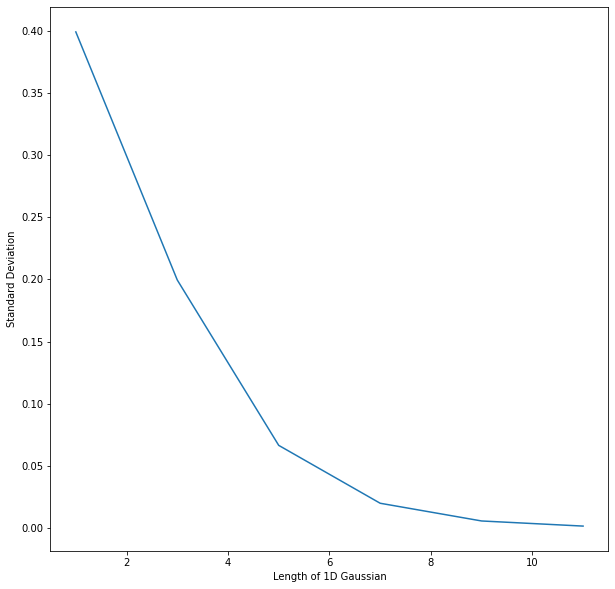

In [33]:
x = [1,3,5,7,9,11]
y = np.zeros(len(x))
for i in range(len(x)):
    a0,a1 = approx1DGaussFilter1(x[i])
    y[i] = a1
fig = plt.figure(figsize=[10,10])
plt.plot(x,y)
plt.xlabel('Length of 1D Gaussian')
plt.ylabel('Standard Deviation')
plt.show()

##### Part B

In [34]:
def approx1DGaussFilter2(sigma):
    x1 = np.ceil(3*sigma).astype(int)
    x2 = np.ceil(5*sigma).astype(int)
    x3 = np.ceil(7*sigma).astype(int)
    k_86_64,s1 = approx1DGaussFilter1(x1)
    k_98_76,s2 = approx1DGaussFilter1(x2)
    k_99_95,s3 = approx1DGaussFilter1(x3)
    k_86_64 = np.asarray(k_86_64)
    k_98_76 = np.asarray(k_98_76)
    k_99_95 = np.asarray(k_99_95)
    return k_86_64,k_98_76,k_99_95

#### 7.1.2.2'2-D' Gaussian Filter
##### Part A

In [35]:
def gaussKernelGenerator(k,sigma):
    gaussian = np.zeros((k,k))
    k=k//2
    for x in range(-k,k+1):
        for y in range(-k,k+1):
            x1=sigma*(2*np.pi)**2
            x2=np.exp(-(x**2+y**2)/(2*sigma**2))
            gaussian[x+k,y+k]=(1/x1)*x2
    gaussian = (gaussian - gaussian.min()) / (gaussian - gaussian.min()).sum()
    return gaussian

##### Part B

In [36]:
def approx2DGaussFilter(sigma):
    k1,k2,k3 = approx1DGaussFilter2(sigma)
    # k2 will at least cover 98,76%, hence we are using it
    k2 = k2.reshape((1,len(k2)))
    kern = np.dot(k2.T,k2)
    sum = np.sum(kern)
    if (sum != 0):
        kern = kern/sum
    return kern

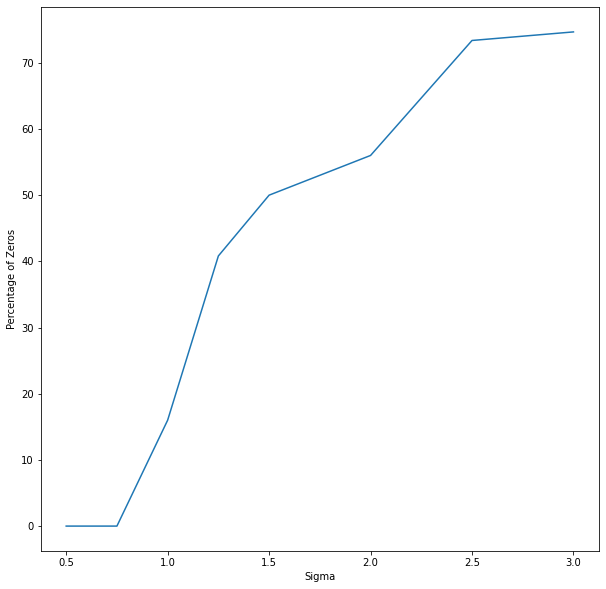

In [37]:
sigma = [0.5,0.75,1,1.25,1.5,2,2.5,3]
perc = np.zeros(len(sigma))
for i in range(len(sigma)):
    y = approx2DGaussFilter(sigma[i])
    y = np.floor(255*y)
    n =  np.count_nonzero(y)
    total = np.size(y)
    perc[i] = 100*(total - n)/total
fig = plt.figure(figsize=[10,10])
plt.plot(sigma,perc)
plt.xlabel('Sigma')
plt.ylabel('Percentage of Zeros')
plt.show()

##### Part C

In [38]:
def gaussianFilter(img,sigma,k):
    kernel = gaussKernelGenerator(k,sigma)
    row,col = img.shape
    padded = np.zeros((row+k-1,col+k-1))
    k=k//2
    out = np.copy(img)
    padded[k:padded.shape[0]-k,k:padded.shape[1]-k]=img
    for i in range(k, padded.shape[0]-k):
        for j in range(k,padded.shape[1]-k):
            temp=padded[i-k:i+k+1,j-k:j+k+1]
            result=temp*kernel
            out[i-k,j-k]=result.sum()
    return out

Text(0.5, 1.0, 'k = 35')

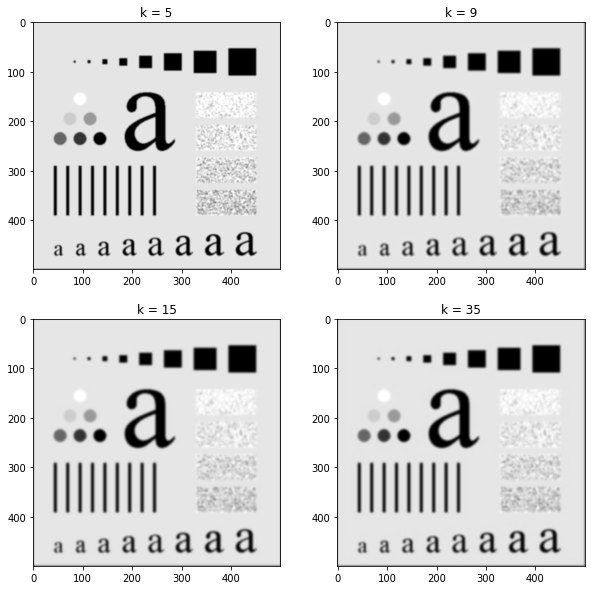

In [39]:
(one, two, three) = cv2.split(testPattern)
gaussFiltered_5 = gaussianFilter(one,2,5)
gaussFiltered_9 = gaussianFilter(one,2,9)
gaussFiltered_15 = gaussianFilter(one,2,15)
gaussFiltered_35 = gaussianFilter(one,2,35)
fig = plt.figure(figsize = [10,10])
plt.subplot(2,2,1)
plt.imshow(gaussFiltered_5, cmap="gray")
plt.title('k = 5')
plt.subplot(2,2,2)
plt.imshow(gaussFiltered_9, cmap="gray")
plt.title('k = 9')
plt.subplot(2,2,3)
plt.imshow(gaussFiltered_15, cmap="gray")
plt.title('k = 15')
plt.subplot(2,2,4)
plt.imshow(gaussFiltered_35, cmap="gray")
plt.title('k = 35')

The Gaussian Filter takes much longer time than mean filter. However, it does not blur much of the actual image. It reduces a lot of the noise from the rectangles while keeping letters readable. The median filter blurs the entire image.<br>
As the sigma becomes larger the more variance allowed around mean and as the sigma becomes smaller the less variance allowed around mean.

##### Part D

Text(0.5, 1.0, 'Heatmap of the error matrix')

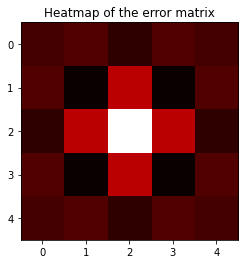

In [40]:
sigma = 1
k = 5
k1 = gaussKernelGenerator(k,sigma)
k2 = approx2DGaussFilter(sigma)
# print(k1.shape)
# print(k2.shape)
err = abs(k2-k1)
plt.imshow(err, cmap='hot')
plt.title('Heatmap of the error matrix')


(15, 15)
(15, 15)


Text(0.5, 1.0, 'Heatmap of the error matrix')

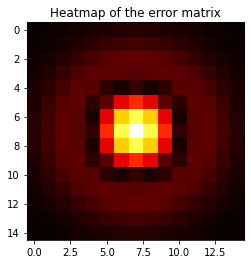

In [41]:
sigma = 3
k = 15
k1 = gaussKernelGenerator(k,sigma)
k2 = approx2DGaussFilter(sigma)
print(k1.shape)
print(k2.shape)
err = abs(k2-k1)
plt.imshow(err, cmap='hot')
plt.title('Heatmap of the error matrix')



As we can see from the heatmap of the difference of two obtained kernels, there is very less difference between the approximate kernel and the actual one. The dark intensities represent low error at the borders and the bright intensities at the center represent more difference in matrices at the center

##### Part E

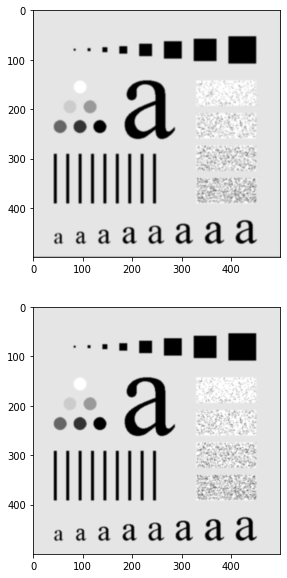

In [42]:
k = 5
sigma = 2
im1 = gaussianFilter(one,sigma,k)
kern,s = approx1DGaussFilter1(k)
kern = kern/np.sum(kern)
kern = kern.reshape((1,len(kern)))
kern2 = kern.T

test = cv2.filter2D(src=one,ddepth=-1,kernel=kern)
im2 = cv2.filter2D(src=test,ddepth=-1,kernel=kern2)
fig = plt.figure(figsize=[10,10])
plt.subplot(2,1,1)
plt.imshow(im1,cmap="gray")
plt.subplot(2,1,2)
plt.imshow(im2,cmap="gray")

From the above images, we can empirically prove that applying a 2D Gaussian is same as applying the horizontal and vertical 1D Gaussians individually in a sequential manner in any order.

## 7.2 Non Linear Filters
### 7.2.1

In [43]:
noisy1 = cv2.imread(IMG_PATH+'noisy1.jpeg')
noisy1 = cv2.cvtColor(noisy1,cv2.COLOR_BGR2RGB)
noisy2 = cv2.imread(IMG_PATH+'noisy2.jpeg')
noisy2 = cv2.cvtColor(noisy2,cv2.COLOR_BGR2RGB)
noisy3 = cv2.imread(IMG_PATH+'noisy3.jpeg')
noisy3 = cv2.cvtColor(noisy3,cv2.COLOR_BGR2RGB)
# plt.imshow(noisy1)

noisy 1 has a lot of pepper noise<br>
noisy 2 has a lot of salt noise<br>
noisy 3 has a lot of salt and pepper noise<br> 

In [44]:
def maxFilter(img, k):
  kSqr = k ** 2
  kby2 = int(k/2)
  # Padding image
  img3 = np.zeros((img.shape[0] + 2 * kby2, img.shape[1] + 2 * kby2))
  img3[kby2:img3.shape[0] - kby2, kby2:img3.shape[1] - kby2] = img
  result = img3.copy()
  img3 = img3.astype('float')
  result = result.astype('float')
  # Applying convolution
  for r in range(kby2, img3.shape[0] - kby2):
    for c in range(kby2, img3.shape[1] - kby2):
      result[r][c] = np.max(img3[r - int(k / 2):r - int(k / 2) + k, c - int(k / 2):c - int(k / 2) + k])
  # Removing padded region and returning
  return np.rint(result[kby2:result.shape[0] - kby2, kby2:result.shape[1] - kby2]).astype('uint8')

In [45]:
def minFilter(img, k):
  kSqr = k ** 2
  kby2 = int(k/2)
  # Padding image
  img3 = np.zeros((img.shape[0] + 2 * kby2, img.shape[1] + 2 * kby2))
  img3[kby2:img3.shape[0] - kby2, kby2:img3.shape[1] - kby2] = img
  result = img3.copy()
  img3 = img3.astype('float')
  result = result.astype('float')
  # Applying convolution
  for r in range(kby2, img3.shape[0] - kby2):
    for c in range(kby2, img3.shape[1] - kby2):
      result[r][c] = np.min(img3[r - int(k / 2):r - int(k / 2) + k, c - int(k / 2):c - int(k / 2) + k])
  # Removing padded region and returning
  return np.rint(result[kby2:result.shape[0] - kby2, kby2:result.shape[1] - kby2]).astype('uint8')

In [46]:
def medianFilter(img, k):
  kSqr = k ** 2
  kby2 = int(k/2)
  # Padding image
  img3 = np.zeros((img.shape[0] + 2 * kby2, img.shape[1] + 2 * kby2))
  img3[kby2:img3.shape[0] - kby2, kby2:img3.shape[1] - kby2] = img
  result = img3.copy()
  img3 = img3.astype('float')
  result = result.astype('float')
  # Applying convolution
  for r in range(kby2, img3.shape[0] - kby2):
    for c in range(kby2, img3.shape[1] - kby2):
      result[r][c] = np.median(img3[r - int(k / 2):r - int(k / 2) + k, c - int(k / 2):c - int(k / 2) + k])
  # Removing padded region and returning
  return np.rint(result[kby2:result.shape[0] - kby2, kby2:result.shape[1] - kby2]).astype('uint8')

Text(0.5, 1.0, 'noisy3 filtered')

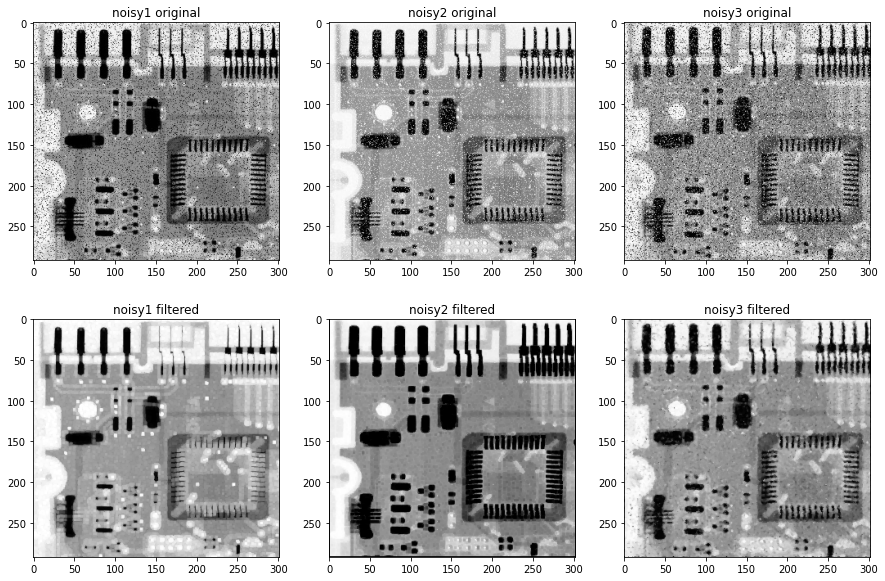

In [47]:
(a1,b1,c1) = cv2.split(noisy1)
(a2,b2,c2) = cv2.split(noisy2)
(a3,b3,c3) = cv2.split(noisy3)

out1 = maxFilter(a1,3)
out2 = minFilter(a2,3)
out3 = medianFilter(a3,3)

fig = plt.figure(figsize=[15,10])
plt.subplot(2,3,1)
plt.imshow(a1,cmap="gray")
plt.title('noisy1 original')
plt.subplot(2,3,4)
plt.imshow(out1,cmap="gray")
plt.title('noisy1 filtered')
plt.subplot(2,3,2)
plt.imshow(a2,cmap="gray")
plt.title('noisy2 original')
plt.subplot(2,3,5)
plt.imshow(out2,cmap="gray")
plt.title('noisy2 filtered')
plt.subplot(2,3,3)
plt.imshow(a3,cmap="gray")
plt.title('noisy3 original')
plt.subplot(2,3,6)
plt.imshow(out3,cmap="gray")
plt.title('noisy3 filtered')

## 7.3 Edge Detection
### 7.3.1

In [48]:
# Function that applies 'filter' on 'img'
def applyFilter(img, filter):
  # Padding image
  maxVal = max(filter.shape)
  img3 = np.zeros((img.shape[0] + 2 * maxVal, img.shape[1] + 2 * maxVal))
  img3[maxVal:img3.shape[0] - maxVal, maxVal:img3.shape[1] - maxVal] = img
  img3 = img3.astype('float')
  filter = filter.astype('float')
  img2 = img3.copy()
  # Convolution
  for r in range(filter.shape[0], img2.shape[0] - filter.shape[0] + 1):
    for c in range(filter.shape[1], img2.shape[1] - filter.shape[1] + 1):
      img2[r][c] = np.sum(img3[r - int(filter.shape[0] / 2):r - int(filter.shape[0] / 2) + filter.shape[0], c - int(filter.shape[1] / 2):c - int(filter.shape[1] / 2) + filter.shape[1]] * filter)
  # Remove padded region and return image
  return img2[maxVal:img2.shape[0] - maxVal, maxVal:img2.shape[1] - maxVal]

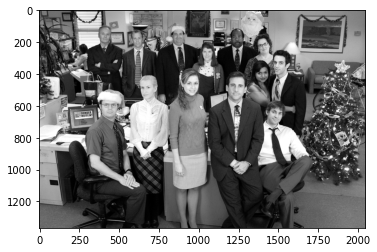

In [49]:
office = cv2.imread(IMG_PATH+'office.jpg')
office = cv2.cvtColor(office,cv2.COLOR_BGR2RGB)
# plt.imshow(office)

# converting to grayscale
(a,b,c) = cv2.split(office)
office2 = a
plt.imshow(office2, cmap="gray")

In [50]:
# Applying Roberts
imgx_Roberts = applyFilter(office2, np.array([[0, 1], [-1, 0]]))
imgy_Roberts = applyFilter(office2, np.array([[1, 0], [0, -1]]))
roberts = np.rint(np.sqrt(imgx_Roberts ** 2 + imgy_Roberts ** 2))
roberts = np.where(roberts > 255, 255, roberts).astype('uint8')

In [51]:
# Applying Prewitt
imgx_Prewitt = applyFilter(office2, np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]))
imgy_Prewitt = applyFilter(office2, np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]]))
prewitt = np.rint(np.sqrt(imgx_Prewitt ** 2 + imgy_Prewitt ** 2))
prewitt = np.where(prewitt > 255, 255, prewitt).astype('uint8')

In [52]:
# Applying Sobel
imgx_Sobel = applyFilter(office2, np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]))
imgy_Sobel = applyFilter(office2, np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]]))
sobel = np.rint(np.sqrt(imgx_Sobel ** 2 + imgy_Sobel ** 2))
sobel = np.where(sobel > 255, 255, sobel).astype('uint8')

In [53]:
# Applying Laplacian 1
laplacian1 = applyFilter(office2, np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]]))
laplacian1 = np.absolute(laplacian1)
laplacian1 = np.where(laplacian1 > 255, 255, laplacian1).astype('uint8')

In [54]:
# Applying Laplacian form 2
laplacian2 = applyFilter(office2, np.array([[1, 1, 1], [1, -8, 1], [1, 1, 1]]))
laplacian2 = np.absolute(laplacian2)
laplacian2 = np.where(laplacian2 > 255, 255, laplacian2).astype('uint8')

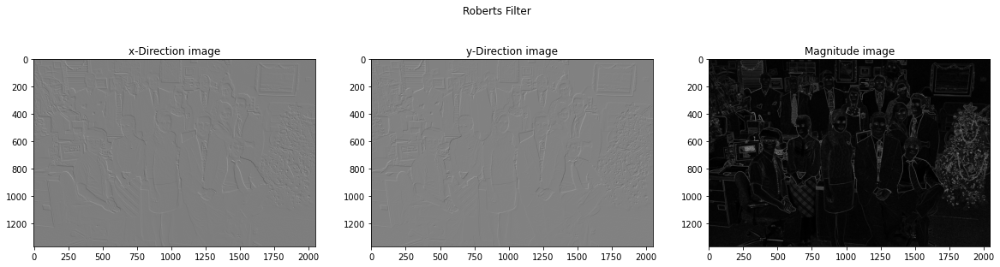

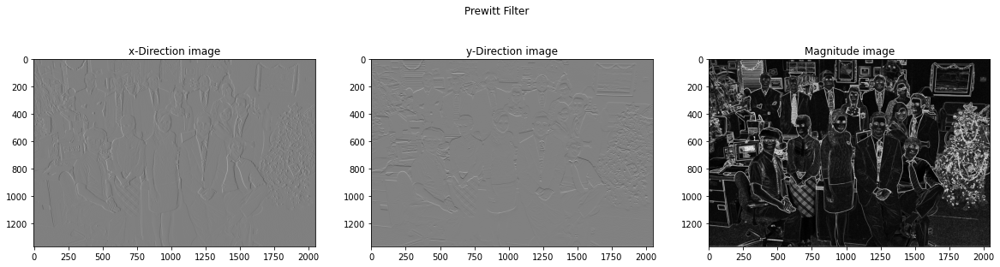

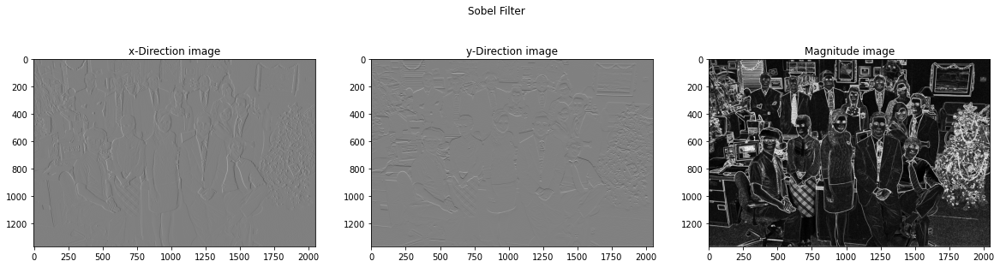

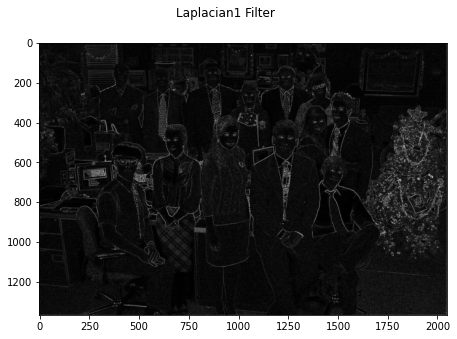

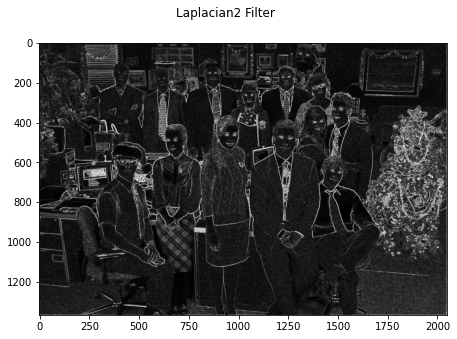

In [55]:
fig = plt.figure(figsize=[20,5])
plt.suptitle('Roberts Filter')
plt.subplot(1,3,1)
plt.imshow(imgx_Roberts,cmap = "gray")
plt.title('x-Direction image')
plt.subplot(1,3,2)
plt.imshow(imgy_Roberts,cmap = "gray")
plt.title('y-Direction image')
plt.subplot(1,3,3)
plt.imshow(roberts,cmap = "gray")
plt.title('Magnitude image')
fig = plt.figure(figsize=[20,5])
plt.suptitle('Prewitt Filter')
plt.subplot(1,3,1)
plt.imshow(imgx_Prewitt,cmap = "gray")
plt.title('x-Direction image')
plt.subplot(1,3,2)
plt.imshow(imgy_Prewitt,cmap = "gray")
plt.title('y-Direction image')
plt.subplot(1,3,3)
plt.imshow(prewitt,cmap = "gray")
plt.title('Magnitude image')
fig = plt.figure(figsize=[20,5])
plt.suptitle('Sobel Filter')
plt.subplot(1,3,1)
plt.imshow(imgx_Sobel,cmap = "gray")
plt.title('x-Direction image')
plt.subplot(1,3,2)
plt.imshow(imgy_Sobel,cmap = "gray")
plt.title('y-Direction image')
plt.subplot(1,3,3)
plt.imshow(sobel,cmap = "gray")
plt.title('Magnitude image')
fig = plt.figure(figsize=[20,5])
plt.suptitle('Laplacian1 Filter')
plt.imshow(laplacian1,cmap = "gray")
fig = plt.figure(figsize=[20,5])
plt.suptitle('Laplacian2 Filter')
plt.imshow(laplacian2,cmap = "gray")

Observations: <br>
Prewitt, Sobel and Laplacian2 filters have brighter and clearer magnitude images than Roberts and Laplacian1 filters.<br>
Laplacian2 filter appears to have the most defined edges out of all the filters.

### 7.3.2

In [56]:
# Applying Sobel size 5

imgx_Sobel5 = applyFilter(office2, np.array([[2, 2, 4, 2, 2], [1, 1, 2, 1, 1], [0, 0, 0, 0, 0], [-1, -1, -2, -1, -1], [-2, -2, -4, -2, -2]]))
imgy_Sobel5 = applyFilter(office2, np.array([[2, 1, 0, -1, -2], [2, 1, 0, -1, -2], [4, 2, 0, -2, -4], [2, 1, 0,-1,-2], [2,1,0,-1,-2]]))
sobel5 = np.rint(np.sqrt(imgx_Sobel5 ** 2 + imgy_Sobel5 ** 2))
sobel5 = np.where(sobel5 > 255, 255, sobel5).astype('uint8')


In [57]:
# Applying Prewitt size 5

imgx_Prewitt5 = applyFilter(office2, np.array([[-1, -1, 0, 1, 1], [-1, -1, 0, 1, 1], [-1, -1,0, 1, 1], [-1, -1, 0, 1, 1], [-1, -1, 0, 1, 1]]))
imgy_Prewitt5 = applyFilter(office2, np.array([[1, 1, 1, 1, 1], [1, 1, 1, 1, 1], [0, 0, 0, 0, 0], [-1, -1, -1, -1, -1], [-1, -1, -1, -1, -1]]))
prewitt5 = np.rint(np.sqrt(imgx_Prewitt5 ** 2 + imgy_Prewitt5 ** 2))
prewitt5 = np.where(prewitt5 > 255, 255, prewitt5).astype('uint8')

Text(0.5, 1.0, 'Magnitude image')

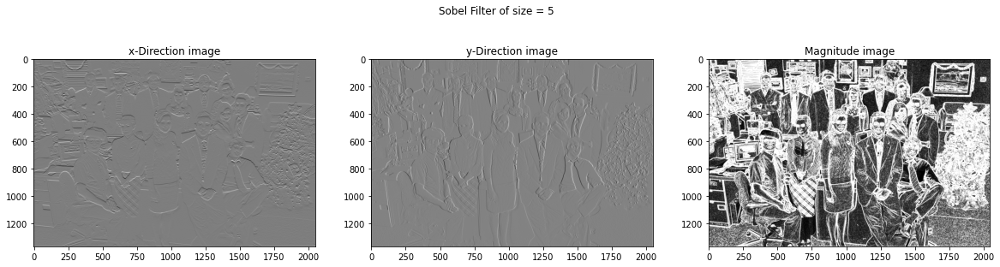

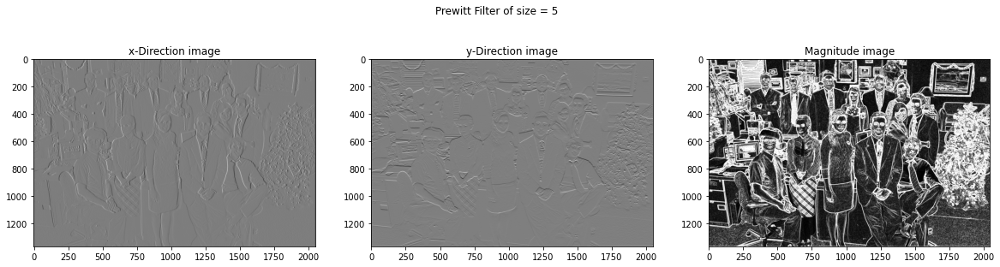

In [58]:
fig = plt.figure(figsize=[20,5])
plt.suptitle('Sobel Filter of size = 5')
plt.subplot(1,3,1)
plt.imshow(imgx_Sobel5,cmap = "gray")
plt.title('x-Direction image')
plt.subplot(1,3,2)
plt.imshow(imgy_Sobel5,cmap = "gray")
plt.title('y-Direction image')
plt.subplot(1,3,3)
plt.imshow(sobel5,cmap = "gray")
plt.title('Magnitude image')
fig = plt.figure(figsize=[20,5])
plt.suptitle('Prewitt Filter of size = 5')
plt.subplot(1,3,1)
plt.imshow(imgx_Prewitt5,cmap = "gray")
plt.title('x-Direction image')
plt.subplot(1,3,2)
plt.imshow(imgy_Prewitt5,cmap = "gray")
plt.title('y-Direction image')
plt.subplot(1,3,3)
plt.imshow(prewitt5,cmap = "gray")
plt.title('Magnitude image')

We can observe that filters with larger sizes have greater brightness than filters with lower sizes. However, this has also damaged the image's clarity, so details are not as obvious in bigger size filters as they are in lower size filters.

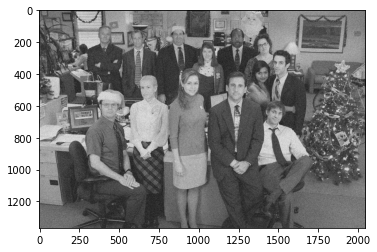

In [59]:
# adding gaussian noise to office2

g = np.rint(255*np.random.rand(office2.shape[0],office2.shape[1]))
office3 = office2+0.5*g
plt.imshow(office3,cmap="gray")

In [60]:
# Applying Roberts
imgx_Roberts = applyFilter(office3, np.array([[0, 1], [-1, 0]]))
imgy_Roberts = applyFilter(office3, np.array([[1, 0], [0, -1]]))
roberts = np.rint(np.sqrt(imgx_Roberts ** 2 + imgy_Roberts ** 2))
roberts = np.where(roberts > 255, 255, roberts).astype('uint8')

In [61]:
# Applying Prewitt
imgx_Prewitt = applyFilter(office3, np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]))
imgy_Prewitt = applyFilter(office3, np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]]))
prewitt = np.rint(np.sqrt(imgx_Prewitt ** 2 + imgy_Prewitt ** 2))
prewitt = np.where(prewitt > 255, 255, prewitt).astype('uint8')

In [62]:
# Applying Sobel
imgx_Sobel = applyFilter(office3, np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]))
imgy_Sobel = applyFilter(office3, np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]]))
sobel = np.rint(np.sqrt(imgx_Sobel ** 2 + imgy_Sobel ** 2))
sobel = np.where(sobel > 255, 255, sobel).astype('uint8')

In [63]:
# Applying Laplacian 1
laplacian1 = applyFilter(office3, np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]]))
laplacian1 = np.absolute(laplacian1)
laplacian1 = np.where(laplacian1 > 255, 255, laplacian1).astype('uint8')

In [64]:
# Applying Laplacian form 2
laplacian2 = applyFilter(office3, np.array([[1, 1, 1], [1, -8, 1], [1, 1, 1]]))
laplacian2 = np.absolute(laplacian2)
laplacian2 = np.where(laplacian2 > 255, 255, laplacian2).astype('uint8')

In [65]:
# Applying Sobel size 5

imgx_Sobel5 = applyFilter(office3, np.array([[2, 2, 4, 2, 2], [1, 1, 2, 1, 1], [0, 0, 0, 0, 0], [-1, -1, -2, -1, -1], [-2, -2, -4, -2, -2]]))
imgy_Sobel5 = applyFilter(office3, np.array([[2, 1, 0, -1, -2], [2, 1, 0, -1, -2], [4, 2, 0, -2, -4], [2, 1, 0,-1,-2], [2,1,0,-1,-2]]))
sobel5 = np.rint(np.sqrt(imgx_Sobel5 ** 2 + imgy_Sobel5 ** 2))
sobel5 = np.where(sobel5 > 255, 255, sobel5).astype('uint8')


In [66]:
# Applying Prewitt size 5

imgx_Prewitt5 = applyFilter(office3, np.array([[-1, -1, 0, 1, 1], [-1, -1, 0, 1, 1], [-1, -1,0, 1, 1], [-1, -1, 0, 1, 1], [-1, -1, 0, 1, 1]]))
imgy_Prewitt5 = applyFilter(office3, np.array([[1, 1, 1, 1, 1], [1, 1, 1, 1, 1], [0, 0, 0, 0, 0], [-1, -1, -1, -1, -1], [-1, -1, -1, -1, -1]]))
prewitt5 = np.rint(np.sqrt(imgx_Prewitt5 ** 2 + imgy_Prewitt5 ** 2))
prewitt5 = np.where(prewitt5 > 255, 255, prewitt5).astype('uint8')

Text(0.5, 1.0, 'Magnitude image')

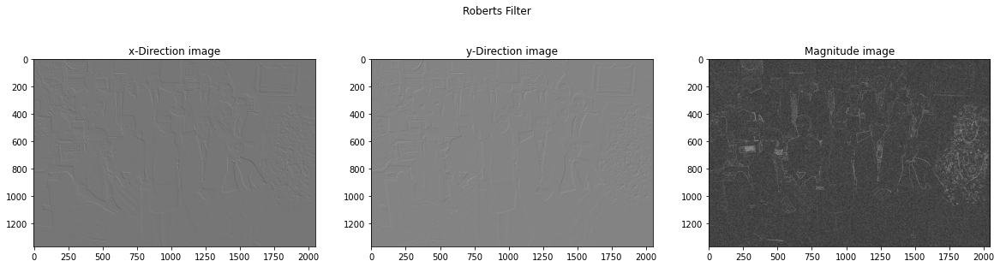

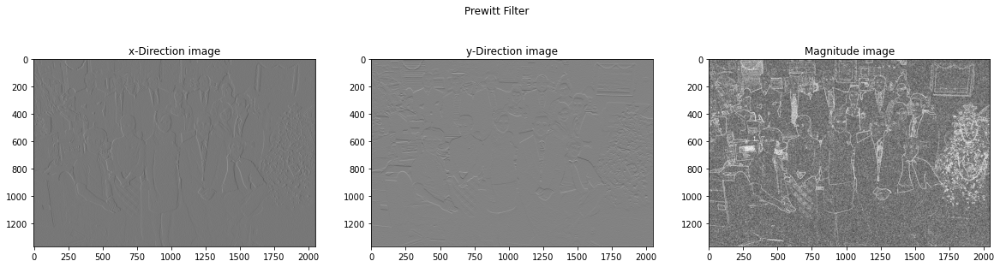

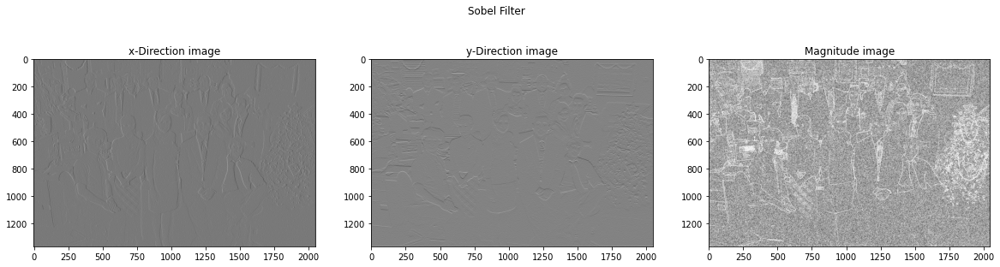

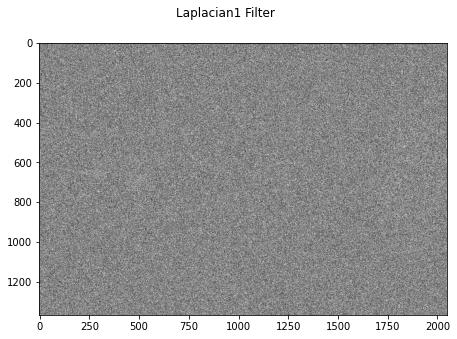

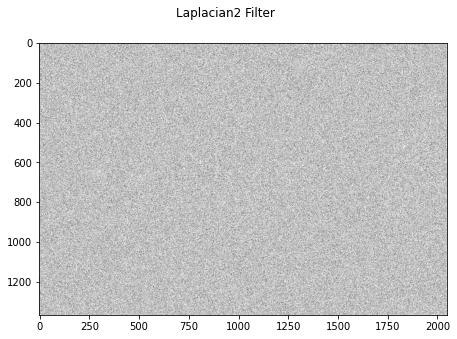

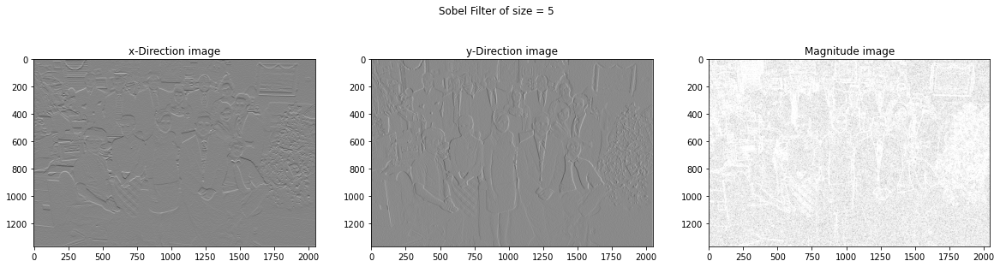

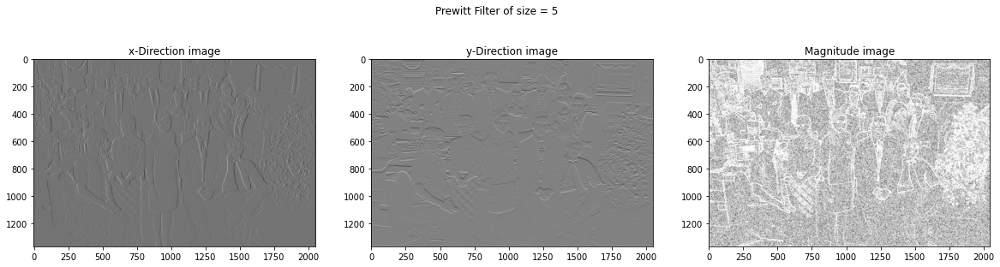

In [67]:
fig = plt.figure(figsize=[20,5])
plt.suptitle('Roberts Filter')
plt.subplot(1,3,1)
plt.imshow(imgx_Roberts,cmap = "gray")
plt.title('x-Direction image')
plt.subplot(1,3,2)
plt.imshow(imgy_Roberts,cmap = "gray")
plt.title('y-Direction image')
plt.subplot(1,3,3)
plt.imshow(roberts,cmap = "gray")
plt.title('Magnitude image')
fig = plt.figure(figsize=[20,5])
plt.suptitle('Prewitt Filter')
plt.subplot(1,3,1)
plt.imshow(imgx_Prewitt,cmap = "gray")
plt.title('x-Direction image')
plt.subplot(1,3,2)
plt.imshow(imgy_Prewitt,cmap = "gray")
plt.title('y-Direction image')
plt.subplot(1,3,3)
plt.imshow(prewitt,cmap = "gray")
plt.title('Magnitude image')
fig = plt.figure(figsize=[20,5])
plt.suptitle('Sobel Filter')
plt.subplot(1,3,1)
plt.imshow(imgx_Sobel,cmap = "gray")
plt.title('x-Direction image')
plt.subplot(1,3,2)
plt.imshow(imgy_Sobel,cmap = "gray")
plt.title('y-Direction image')
plt.subplot(1,3,3)
plt.imshow(sobel,cmap = "gray")
plt.title('Magnitude image')
fig = plt.figure(figsize=[20,5])
plt.suptitle('Laplacian1 Filter')
plt.imshow(laplacian1,cmap = "gray")
fig = plt.figure(figsize=[20,5])
plt.suptitle('Laplacian2 Filter')
plt.imshow(laplacian2,cmap = "gray")
fig = plt.figure(figsize=[20,5])
plt.suptitle('Sobel Filter of size = 5')
plt.subplot(1,3,1)
plt.imshow(imgx_Sobel5,cmap = "gray")
plt.title('x-Direction image')
plt.subplot(1,3,2)
plt.imshow(imgy_Sobel5,cmap = "gray")
plt.title('y-Direction image')
plt.subplot(1,3,3)
plt.imshow(sobel5,cmap = "gray")
plt.title('Magnitude image')
fig = plt.figure(figsize=[20,5])
plt.suptitle('Prewitt Filter of size = 5')
plt.subplot(1,3,1)
plt.imshow(imgx_Prewitt5,cmap = "gray")
plt.title('x-Direction image')
plt.subplot(1,3,2)
plt.imshow(imgy_Prewitt5,cmap = "gray")
plt.title('y-Direction image')
plt.subplot(1,3,3)
plt.imshow(prewitt5,cmap = "gray")
plt.title('Magnitude image')

Observations: <br>
Prewitt filter appears to be the most robust to noise. It  is followed by Sobel and Roberts filters.<br>
The laplacian filters are the least robust to noise. Their magnitude images appear to be mostly just noise.<br>

# Answer 8

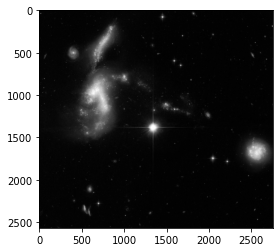

In [68]:
# Loading Image and converting to grayscale
galaxies = cv2.imread(IMG_PATH+'galaxies.jpeg')
galaxies2 = cv2.cvtColor(galaxies,cv2.COLOR_BGR2GRAY)
plt.imshow(galaxies2,cmap="gray")

We can apply minFilter to remove the stars which appear like salt noise

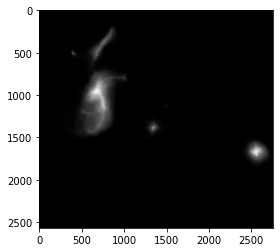

In [69]:
galaxies3 = minFilter(galaxies2,71)
plt.imshow(galaxies3,cmap="gray")

Most of the stars have been removed. Next we can apply thresholding using piecewise transform to obtain the required image.

In [70]:
# converting galaxies3 from shape [a,b] to [a,b,3] to apply piecewiseLinTransform
galaxies4 = cv2.merge((galaxies3,galaxies3,galaxies3))

In [71]:
k1 = [0,0]
k2 = [0,1]
a = [0,0.28]
b = [0.28,1]
galaxies5 = piecewiseLinTransform(galaxies4,k1,k2,a,b)

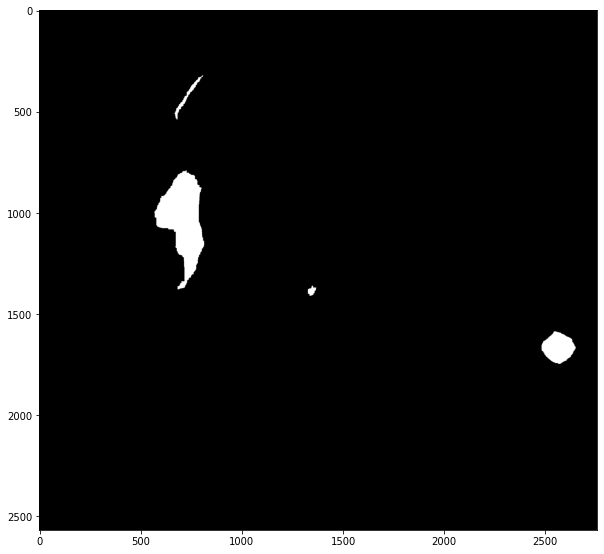

In [72]:
fig = plt.figure(figsize=[10,10])
plt.imshow(galaxies5)